In [ ]:
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from model import DiffusionModel, ImageDiffuser
from train import train, show_tensor_image

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
IMG_SIZE = 128
BATCH_SIZE = 32

In [4]:
!pip install kaggle

In [5]:
!kaggle datasets download -d jessicali9530/celeba-dataset
!unzip celeba-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: img_align_celeba/img_align_celeba/197605.jpg  
  inflating: img_align_celeba/img_align_celeba/197606.jpg  
  inflating: img_align_celeba/img_align_celeba/197607.jpg  
  inflating: img_align_celeba/img_align_celeba/197608.jpg  
  inflating: img_align_celeba/img_align_celeba/197609.jpg  
  inflating: img_align_celeba/img_align_celeba/197610.jpg  
  inflating: img_align_celeba/img_align_celeba/197611.jpg  
  inflating: img_align_celeba/img_align_celeba/197612.jpg  
  inflating: img_align_celeba/img_align_celeba/197613.jpg  
  inflating: img_align_celeba/img_align_celeba/197614.jpg  
  inflating: img_align_celeba/img_align_celeba/197615.jpg  
  inflating: img_align_celeba/img_align_celeba/197616.jpg  
  inflating: img_align_celeba/img_align_celeba/197617.jpg  
  inflating: img_align_celeba/img_align_celeba/197618.jpg  
  inflating: img_align_celeba/img_align_celeba/197619.jpg  
  inflating: img_align_celeba/img_align_celeba/19

In [6]:
!mkdir celeba
!mv celeba-dataset/img_align_celeba celeba/

mv: cannot stat 'celeba-dataset/img_align_celeba': No such file or directory


In [5]:
def load_transformed_dataset():
    data_transforms = [
        transforms.CenterCrop(178),
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
    data_transform = transforms.Compose(data_transforms)
    dataset = torchvision.datasets.ImageFolder(
        root="../data",
        transform=data_transform
    )
    #dataset = torchvision.datasets.ImageFolder(
    #    root="data",
    #    transform=data_transform
    #)
    #dataset = torchvision.datasets.CIFAR10(
    #    root=".",
    #    transform=data_transform,
    #    train =True,
    #    download=True
    #)
    #dataset = torchvision.datasets.CelebA(
    #    root=".",
    #    transform=data_transform,
    #    split ='all',
    #    download=True
    #)
    #dataset = torchvision.datasets.MNIST(root=".", train=True, transform=data_transform, download=True)
    return dataset

data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

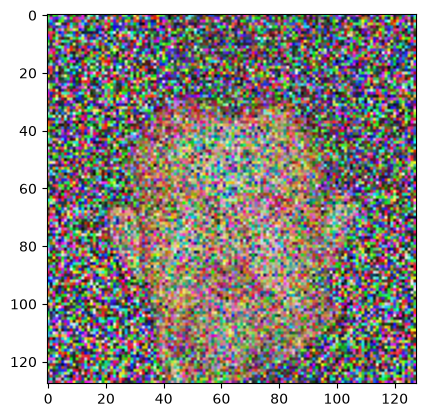

In [8]:
diffuser = ImageDiffuser().to(device)
image = next(iter(dataloader))[0].to(device)
t = torch.ones((image.shape[0],), dtype=torch.long) * 150
noisy_image, noise = diffuser.add_noise(image, t)
show_tensor_image(noisy_image[0].cpu())

In [9]:
from torchsummary import summary


model = DiffusionModel(128,[1,2,2,4,4],time_embed_dim=256,num_timesteps=400,ending_channels=3,num_blocks=5)
#summary(model,(3,IMG_SIZE,IMG_SIZE))

model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4)

In [13]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
count_parameters(model)

55057411

In [10]:
model = torch.compile(model)

W0809 21:28:23.930000 7860 Lib\site-packages\torch\utils\flop_counter.py:29] triton not found; flop counting will not work for triton kernels


In [12]:
model.load_state_dict(torch.load(f"models/diffusion__best.pth", weights_only=True))

<All keys matched successfully>

W0406 09:38:25.181000 925 torch/_inductor/utils.py:1679] [0/0] Not enough SMs to use max_autotune_gemm mode


Epoch: 0, Iteration: 0, Loss: 0.013169735670089722, Full Loss:0.013169735670089722, Lr: 4.000000000000001e-06, Time: 88.8805046081543


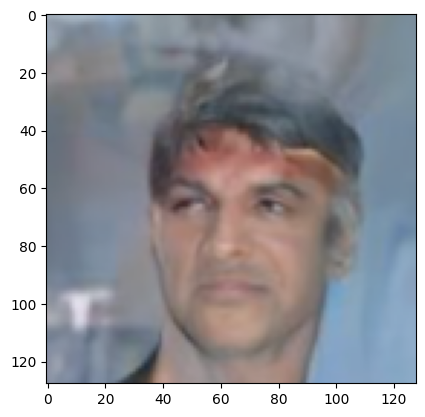

Epoch: 0, Iteration: 100, Loss: 0.018518609926104546, Full Loss:0.018465649336576462, Lr: 0.00019999999955395785, Time: 137.02761697769165
Epoch: 0, Iteration: 200, Loss: 0.017412610352039337, Full Loss:0.017941750586032867, Lr: 0.00019999544996247574, Time: 135.51776790618896
Epoch: 0, Iteration: 300, Loss: 0.018148384988307953, Full Loss:0.018010398373007774, Lr: 0.00019998198005289125, Time: 136.6629388332367
Epoch: 0, Iteration: 400, Loss: 0.018613459542393684, Full Loss:0.018160786479711533, Lr: 0.00019995959116033722, Time: 136.13133883476257
Epoch: 0, Iteration: 500, Loss: 0.018865428864955902, Full Loss:0.018301434814929962, Lr: 0.00019992828550399302, Time: 136.32985639572144
Epoch: 0, Iteration: 600, Loss: 0.01831068843603134, Full Loss:0.018302975222468376, Lr: 0.00019988806618686454, Time: 135.40616059303284
Epoch: 0, Iteration: 700, Loss: 0.017752185463905334, Full Loss:0.018224401399493217, Lr: 0.0001998389371954767, Time: 136.55919742584229
Epoch: 0, Iteration: 800, Loss

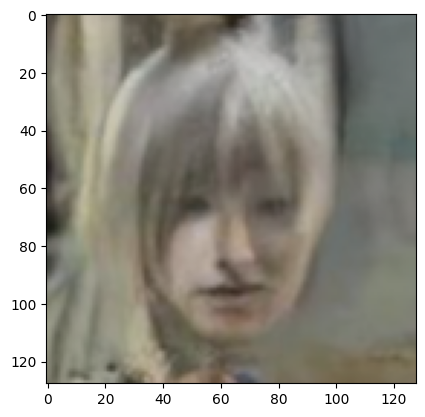

Epoch: 0, Iteration: 1100, Loss: 0.018097715452313423, Full Loss:0.01817476563155651, Lr: 0.00019955343511641593, Time: 136.14910578727722
Epoch: 0, Iteration: 1200, Loss: 0.017481528222560883, Full Loss:0.018117045983672142, Lr: 0.00019945984844220912, Time: 136.6644721031189
Epoch: 0, Iteration: 1300, Loss: 0.018343692645430565, Full Loss:0.01813446544110775, Lr: 0.00019935739453853877, Time: 137.33183526992798
Epoch: 0, Iteration: 1400, Loss: 0.01845559850335121, Full Loss:0.018157387152314186, Lr: 0.00019924608356060061, Time: 137.8598713874817
Epoch: 0, Iteration: 1500, Loss: 0.016647323966026306, Full Loss:0.018056783825159073, Lr: 0.00019912592654150064, Time: 137.52100896835327
Epoch: 0, Iteration: 1600, Loss: 0.018223166465759277, Full Loss:0.018067175522446632, Lr: 0.00019899693539116123, Time: 137.87183475494385
Epoch: 0, Iteration: 1700, Loss: 0.017104070633649826, Full Loss:0.01801055669784546, Lr: 0.000198859122895141, Time: 138.42591667175293
Epoch: 0, Iteration: 1800, L

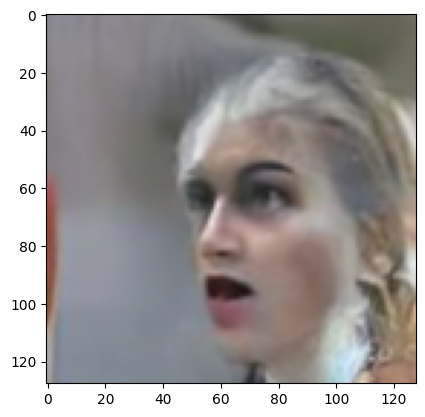

Epoch: 0, Iteration: 2100, Loss: 0.018009841442108154, Full Loss:0.018145209178328514, Lr: 0.0001982199457392897, Time: 138.60368084907532
Epoch: 0, Iteration: 2200, Loss: 0.018546421080827713, Full Loss:0.018163438886404037, Lr: 0.00019803824885194463, Time: 138.11827087402344
Epoch: 0, Iteration: 2300, Loss: 0.018049996346235275, Full Loss:0.018158508464694023, Lr: 0.0001978478256435993, Time: 137.70072603225708
Epoch: 0, Iteration: 2400, Loss: 0.01729574054479599, Full Loss:0.01812257431447506, Lr: 0.0001976486949889368, Time: 138.03326559066772
Epoch: 0, Iteration: 2500, Loss: 0.018024995923042297, Full Loss:0.01811867393553257, Lr: 0.0001974408766257192, Time: 137.9209849834442
Epoch: 0, Iteration: 2600, Loss: 0.017701588571071625, Full Loss:0.01810263842344284, Lr: 0.00019722439115283136, Time: 137.741201877594
Epoch: 0, Iteration: 2700, Loss: 0.018884358927607536, Full Loss:0.01813158020377159, Lr: 0.000196999260028239, Time: 137.86595702171326
Epoch: 0, Iteration: 2800, Loss: 0

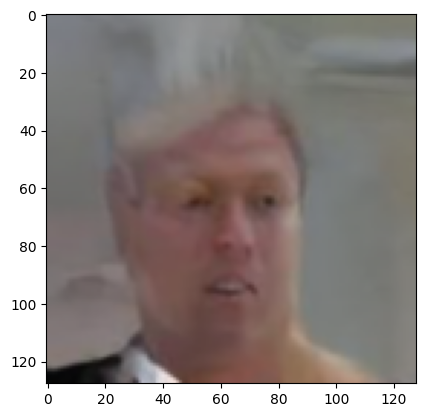

Epoch: 0, Iteration: 3100, Loss: 0.0182320736348629, Full Loss:0.018135081976652145, Lr: 0.0001960127381184888, Time: 136.69405460357666
Epoch: 0, Iteration: 3200, Loss: 0.018150383606553078, Full Loss:0.01813555881381035, Lr: 0.00019574473051905887, Time: 136.49303436279297
Epoch: 0, Iteration: 3300, Loss: 0.018137363716959953, Full Loss:0.018135614693164825, Lr: 0.00019546822393137845, Time: 136.65530014038086
Epoch: 0, Iteration: 3400, Loss: 0.019048547372221947, Full Loss:0.018162457272410393, Lr: 0.00019518324576268554, Time: 135.95496726036072
Epoch: 0, Iteration: 3500, Loss: 0.018032515421509743, Full Loss:0.018158746883273125, Lr: 0.00019488982425991847, Time: 136.4508192539215
Epoch: 0, Iteration: 3600, Loss: 0.018497005105018616, Full Loss:0.018168136477470398, Lr: 0.00019458798850691573, Time: 136.28068661689758
Epoch: 0, Iteration: 3700, Loss: 0.01906207762658596, Full Loss:0.018192294985055923, Lr: 0.00019427776842153362, Time: 136.3116638660431
Epoch: 0, Iteration: 3800, 

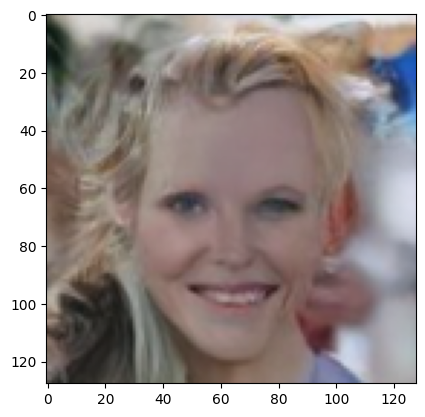

Epoch: 0, Iteration: 4100, Loss: 0.016929462552070618, Full Loss:0.01815124601125717, Lr: 0.00019295367213558205, Time: 135.68027472496033
Epoch: 0, Iteration: 4200, Loss: 0.0187772698700428, Full Loss:0.01816614530980587, Lr: 0.00019260200813457613, Time: 136.09572982788086
Epoch: 0, Iteration: 4300, Loss: 0.01860875077545643, Full Loss:0.01817643828690052, Lr: 0.00019224215665088347, Time: 135.51083087921143
Epoch: 0, Iteration: 4400, Loss: 0.018190698698163033, Full Loss:0.018176762387156487, Lr: 0.00019187415335285963, Time: 135.96114325523376
Epoch: 0, Iteration: 4500, Loss: 0.018192825838923454, Full Loss:0.01817712001502514, Lr: 0.00019149803471686509, Time: 136.19824528694153
Epoch: 0, Iteration: 4600, Loss: 0.018073804676532745, Full Loss:0.018174871802330017, Lr: 0.00019111383802364996, Time: 135.74013423919678
Epoch: 0, Iteration: 4700, Loss: 0.01752563752233982, Full Loss:0.018161064013838768, Lr: 0.00019072160135465857, Time: 135.70874214172363
Epoch: 0, Iteration: 4800, L

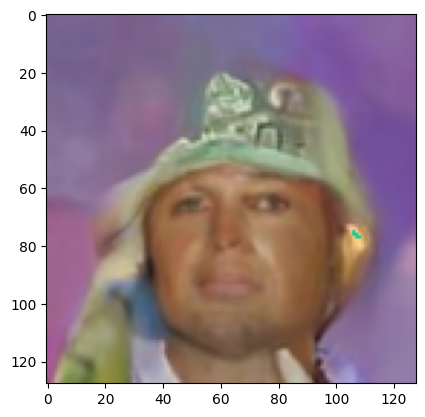

Epoch: 0, Iteration: 5100, Loss: 0.0179959237575531, Full Loss:0.018150657415390015, Lr: 0.00018907304436052846, Time: 135.37877130508423
Epoch: 0, Iteration: 5200, Loss: 0.01907346397638321, Full Loss:0.01816840097308159, Lr: 0.00018864120678998352, Time: 136.06139397621155
Epoch: 0, Iteration: 5300, Loss: 0.01804274134337902, Full Loss:0.018166029825806618, Lr: 0.00018820157433002132, Time: 135.85035514831543
Epoch: 0, Iteration: 5400, Loss: 0.017707206308841705, Full Loss:0.018157534301280975, Lr: 0.0001877541905568603, Time: 135.94321036338806
Epoch: 0, Iteration: 5500, Loss: 0.017276475206017494, Full Loss:0.018141519278287888, Lr: 0.00018729909981502643, Time: 136.04717206954956
Epoch: 0, Iteration: 5600, Loss: 0.01781761832535267, Full Loss:0.018135737627744675, Lr: 0.0001868363472129578, Time: 134.81288719177246
Epoch: 0, Iteration: 5700, Loss: 0.017902158200740814, Full Loss:0.018131636083126068, Lr: 0.0001863659786185335, Time: 135.8059585094452
Epoch: 0, Iteration: 5800, Los

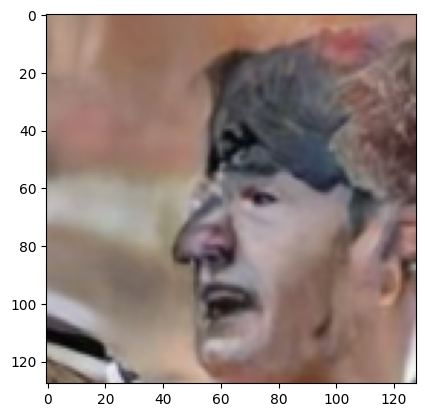

Epoch: 0, Iteration: 6100, Loss: 0.018177447840571404, Full Loss:0.01811632141470909, Lr: 0.00018440928799860336, Time: 135.49836206436157
Epoch: 0, Iteration: 6200, Loss: 0.017814870923757553, Full Loss:0.0181114599108696, Lr: 0.00018390155371859375, Time: 136.19494605064392
Epoch: 0, Iteration: 6300, Loss: 0.018179895356297493, Full Loss:0.0181125458329916, Lr: 0.000183386494341952, Time: 136.14648914337158
Epoch: 1, Iteration: 0, Loss: 0.017802871763706207, Full Loss:0.018111029639840126, Lr: 0.0001832253465368131, Time: 51.594003677368164


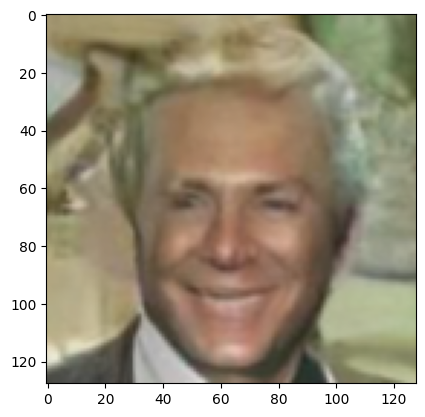

Epoch: 1, Iteration: 100, Loss: 0.018046356737613678, Full Loss:0.01811002381145954, Lr: 0.00018270076864144652, Time: 137.1862771511078
Epoch: 1, Iteration: 200, Loss: 0.017157331109046936, Full Loss:0.018095437437295914, Lr: 0.0001821689846708524, Time: 136.33156752586365
Epoch: 1, Iteration: 300, Loss: 0.01779317669570446, Full Loss:0.018090881407260895, Lr: 0.0001816300473352753, Time: 136.316481590271
Epoch: 1, Iteration: 400, Loss: 0.017720935866236687, Full Loss:0.018085384741425514, Lr: 0.00018108401005399892, Time: 136.7563977241516
Epoch: 1, Iteration: 500, Loss: 0.01786603406071663, Full Loss:0.01808217354118824, Lr: 0.00018053092695005112, Time: 136.67372131347656
Epoch: 1, Iteration: 600, Loss: 0.017952103167772293, Full Loss:0.018080299720168114, Lr: 0.00017997085284483924, Time: 136.64901041984558
Epoch: 1, Iteration: 700, Loss: 0.017792286351323128, Full Loss:0.018076203763484955, Lr: 0.0001794038432527163, Time: 137.1257016658783
Epoch: 1, Iteration: 800, Loss: 0.01710

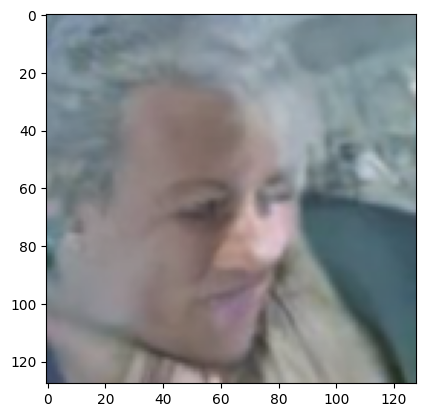

Epoch: 1, Iteration: 1100, Loss: 0.01908090151846409, Full Loss:0.018085137009620667, Lr: 0.00017706758424522513, Time: 137.14203023910522
Epoch: 1, Iteration: 1200, Loss: 0.018022488802671432, Full Loss:0.01808430440723896, Lr: 0.00017646675379796013, Time: 137.21359729766846
Epoch: 1, Iteration: 1300, Loss: 0.017565196380019188, Full Loss:0.01807750202715397, Lr: 0.00017585933518887855, Time: 137.43382668495178
Epoch: 1, Iteration: 1400, Loss: 0.01954101026058197, Full Loss:0.018096430227160454, Lr: 0.0001752453886251044, Time: 137.03876423835754
Epoch: 1, Iteration: 1500, Loss: 0.0185281690210104, Full Loss:0.018101941794157028, Lr: 0.0001746249749608103, Time: 137.7248878479004
Epoch: 1, Iteration: 1600, Loss: 0.018487071618437767, Full Loss:0.018106797710061073, Lr: 0.0001739981556911856, Time: 137.75281357765198
Epoch: 1, Iteration: 1700, Loss: 0.019146017730236053, Full Loss:0.01811973750591278, Lr: 0.00017336499294634116, Time: 137.4717299938202
Epoch: 1, Iteration: 1800, Loss:

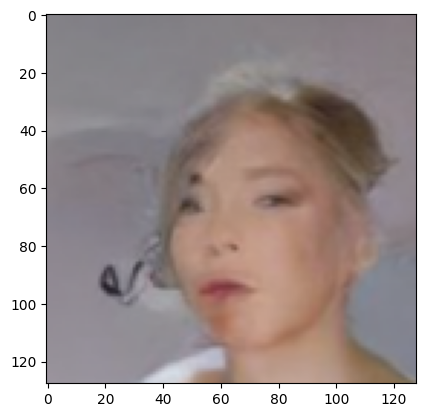

Epoch: 1, Iteration: 2100, Loss: 0.018516264855861664, Full Loss:0.01811354234814644, Lr: 0.000170770171692625, Time: 135.99520134925842
Epoch: 1, Iteration: 2200, Loss: 0.018839992582798004, Full Loss:0.018122058361768723, Lr: 0.00017010624531103792, Time: 136.87201595306396
Epoch: 1, Iteration: 2300, Loss: 0.018747828900814056, Full Loss:0.01812930591404438, Lr: 0.00016943636121905176, Time: 136.48346853256226
Epoch: 1, Iteration: 2400, Loss: 0.01906670071184635, Full Loss:0.018140040338039398, Lr: 0.00016876058581534773, Time: 136.78263878822327
Epoch: 1, Iteration: 2500, Loss: 0.017933443188667297, Full Loss:0.018137704581022263, Lr: 0.00016807898608255185, Time: 136.35225915908813
Epoch: 1, Iteration: 2600, Loss: 0.018663788214325905, Full Loss:0.01814359426498413, Lr: 0.00016739162958059555, Time: 136.11205554008484
Epoch: 1, Iteration: 2700, Loss: 0.017894024029374123, Full Loss:0.018140830099582672, Lr: 0.0001666985844400194, Time: 136.25704312324524
Epoch: 1, Iteration: 2800, 

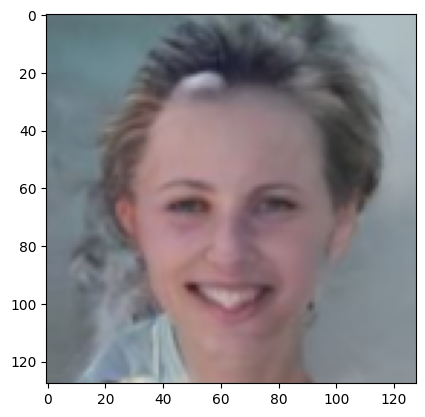

Epoch: 1, Iteration: 3100, Loss: 0.017574165016412735, Full Loss:0.018114563077688217, Lr: 0.00016387089969390823, Time: 136.50627446174622
Epoch: 1, Iteration: 3200, Loss: 0.018373122438788414, Full Loss:0.018117276951670647, Lr: 0.0001631504528138281, Time: 135.9130334854126
Epoch: 1, Iteration: 3300, Loss: 0.018611816689372063, Full Loss:0.018122408539056778, Lr: 0.00016242473767911315, Time: 136.29263997077942
Epoch: 1, Iteration: 3400, Loss: 0.01797872595489025, Full Loss:0.018120933324098587, Lr: 0.00016169382622239828, Time: 136.33036303520203
Epoch: 1, Iteration: 3500, Loss: 0.018909763544797897, Full Loss:0.018128955736756325, Lr: 0.00016095779089137616, Time: 136.1178936958313
Epoch: 1, Iteration: 3600, Loss: 0.017832770943641663, Full Loss:0.018125971779227257, Lr: 0.00016021670464161613, Time: 135.87479948997498
Epoch: 1, Iteration: 3700, Loss: 0.018239308148622513, Full Loss:0.01812710240483284, Lr: 0.00015947064092933284, Time: 135.56931495666504
Epoch: 1, Iteration: 3800

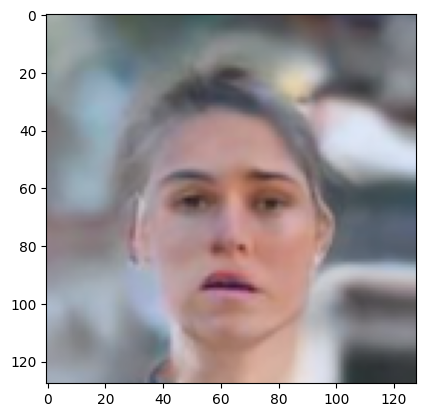

Epoch: 1, Iteration: 4100, Loss: 0.0187729150056839, Full Loss:0.01813557744026184, Lr: 0.00015643809769274922, Time: 135.6239721775055
Epoch: 1, Iteration: 4200, Loss: 0.019067034125328064, Full Loss:0.01814442127943039, Lr: 0.0001556682655212707, Time: 136.44435119628906
Epoch: 1, Iteration: 4300, Loss: 0.017907999455928802, Full Loss:0.018142197281122208, Lr: 0.00015489390672699288, Time: 136.54007053375244
Epoch: 1, Iteration: 4400, Loss: 0.017803233116865158, Full Loss:0.01813904009759426, Lr: 0.0001541150980640936, Time: 135.78951025009155
Epoch: 1, Iteration: 4500, Loss: 0.017897721379995346, Full Loss:0.01813681051135063, Lr: 0.00015333191672782016, Time: 135.75637316703796
Epoch: 1, Iteration: 4600, Loss: 0.017739756032824516, Full Loss:0.01813318021595478, Lr: 0.0001525444403468377, Time: 135.92103552818298
Epoch: 1, Iteration: 4700, Loss: 0.017860019579529762, Full Loss:0.018130704760551453, Lr: 0.00015175274697553476, Time: 135.55914616584778
Epoch: 1, Iteration: 4800, Loss

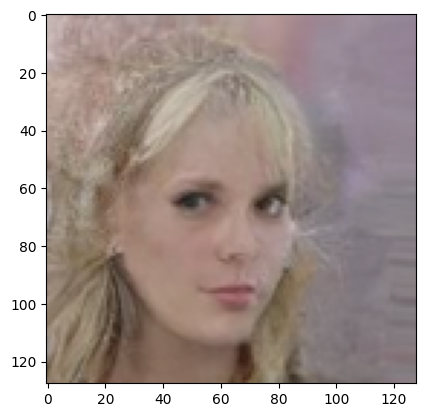

Epoch: 1, Iteration: 5100, Loss: 0.01790403015911579, Full Loss:0.018115274608135223, Lr: 0.00014854537914079556, Time: 135.06400752067566
Epoch: 1, Iteration: 5200, Loss: 0.01901128701865673, Full Loss:0.018123043701052666, Lr: 0.00014773378599016628, Time: 136.0202305316925
Epoch: 1, Iteration: 5300, Loss: 0.01903480850160122, Full Loss:0.01813088171184063, Lr: 0.0001469184526796247, Time: 135.78892421722412
Epoch: 1, Iteration: 5400, Loss: 0.018796926364302635, Full Loss:0.018136557191610336, Lr: 0.00014609946002472864, Time: 135.74416255950928
Epoch: 1, Iteration: 5500, Loss: 0.017175382003188133, Full Loss:0.01812843419611454, Lr: 0.0001452768892037489, Time: 135.80266499519348
Epoch: 1, Iteration: 5600, Loss: 0.01707160472869873, Full Loss:0.018119577318429947, Lr: 0.00014445082174962282, Time: 135.70354175567627
Epoch: 1, Iteration: 5700, Loss: 0.01807904988527298, Full Loss:0.018119242042303085, Lr: 0.0001436213395418728, Time: 135.7782645225525
Epoch: 1, Iteration: 5800, Loss:

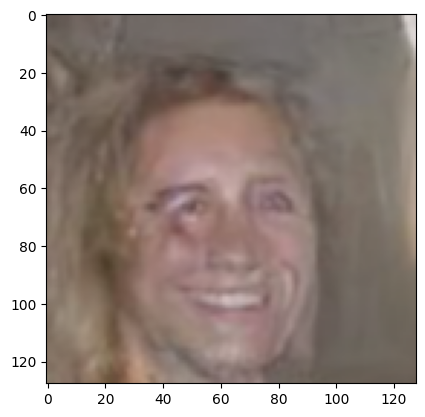

Epoch: 1, Iteration: 6100, Loss: 0.018180185928940773, Full Loss:0.018125759437680244, Lr: 0.00014027091244013873, Time: 135.50689363479614
Epoch: 1, Iteration: 6200, Loss: 0.017169035971164703, Full Loss:0.018118122592568398, Lr: 0.00013942559621761655, Time: 135.89754557609558
Epoch: 1, Iteration: 6300, Loss: 0.017290057614445686, Full Loss:0.018111566081643105, Lr: 0.0001385773633400999, Time: 135.35545754432678
Epoch: 2, Iteration: 0, Loss: 0.01811688207089901, Full Loss:0.0181115809828043, Lr: 0.00013831383205886746, Time: 42.633503675460815


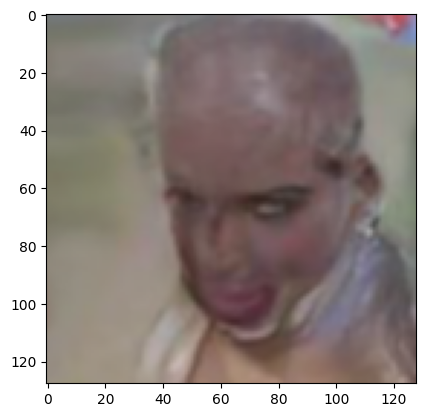

Epoch: 2, Iteration: 100, Loss: 0.017920395359396935, Full Loss:0.018110081553459167, Lr: 0.0001374619056194568, Time: 135.72432112693787
Epoch: 2, Iteration: 200, Loss: 0.018115809187293053, Full Loss:0.01811012625694275, Lr: 0.00013660725716538956, Time: 135.92305850982666
Epoch: 2, Iteration: 300, Loss: 0.018081216141581535, Full Loss:0.01810990460216999, Lr: 0.00013574997140912708, Time: 135.04985094070435
Epoch: 2, Iteration: 400, Loss: 0.01765040121972561, Full Loss:0.018106386065483093, Lr: 0.0001348901333245392, Time: 135.72465300559998
Epoch: 2, Iteration: 500, Loss: 0.019332442432641983, Full Loss:0.018115699291229248, Lr: 0.0001340278281384817, Time: 134.9258749485016
Epoch: 2, Iteration: 600, Loss: 0.018120530992746353, Full Loss:0.018115738406777382, Lr: 0.0001331631413223485, Time: 135.70229816436768
Epoch: 2, Iteration: 700, Loss: 0.01832723431289196, Full Loss:0.01811731979250908, Lr: 0.00013229615858359998, Time: 135.83581280708313
Epoch: 2, Iteration: 800, Loss: 0.018

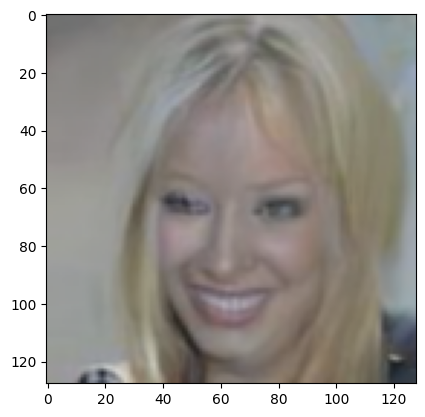

Epoch: 2, Iteration: 1100, Loss: 0.01811268739402294, Full Loss:0.018138224259018898, Lr: 0.00012880699033762077, Time: 135.5595645904541
Epoch: 2, Iteration: 1200, Loss: 0.018185507506132126, Full Loss:0.018138565123081207, Lr: 0.00012792982126411315, Time: 135.85818195343018
Epoch: 2, Iteration: 1300, Loss: 0.01728937216103077, Full Loss:0.018132483586668968, Lr: 0.00012705087499287763, Time: 135.16862511634827
Epoch: 2, Iteration: 1400, Loss: 0.017637940123677254, Full Loss:0.01812896504998207, Lr: 0.00012617023864476686, Time: 135.4837145805359
Epoch: 2, Iteration: 1500, Loss: 0.01710212416946888, Full Loss:0.018121715635061264, Lr: 0.00012528799950815332, Time: 135.56942462921143
Epoch: 2, Iteration: 1600, Loss: 0.01787758059799671, Full Loss:0.01812000386416912, Lr: 0.00012440424503027734, Time: 135.56505417823792
Epoch: 2, Iteration: 1700, Loss: 0.01738898456096649, Full Loss:0.018114913254976273, Lr: 0.0001235190628085793, Time: 135.80848741531372
Epoch: 2, Iteration: 1800, Los

In [ ]:
train(dataloader, 5, model, optimizer, device, print_iterations_steps=100,min_lr=2e-5,max_lr=2e-4)

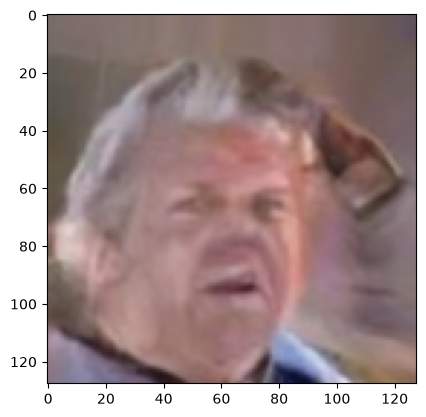

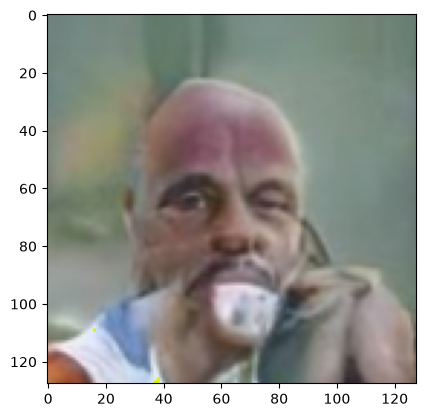

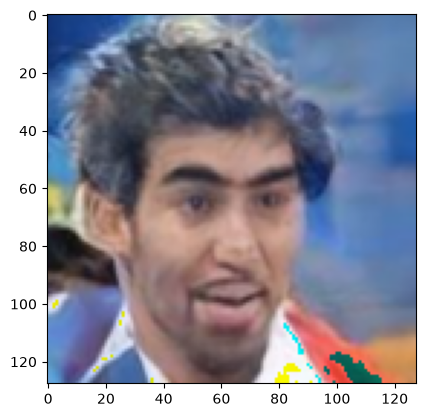

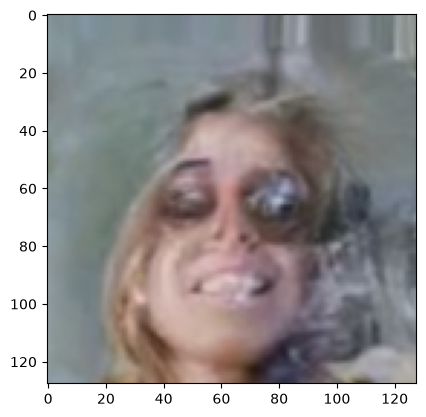

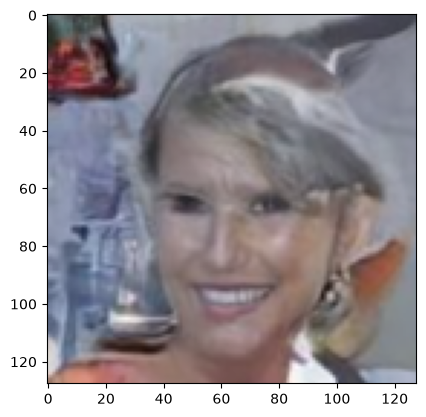

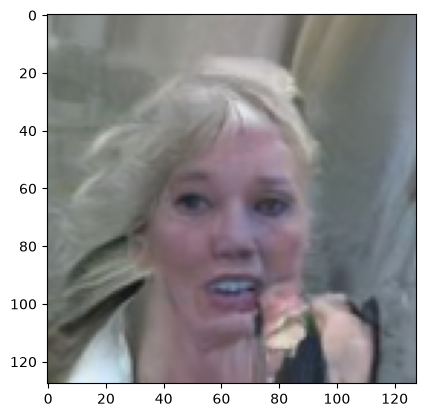

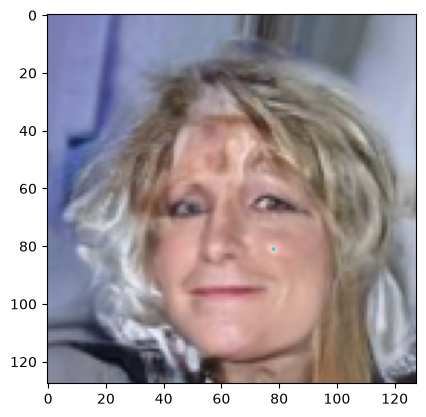

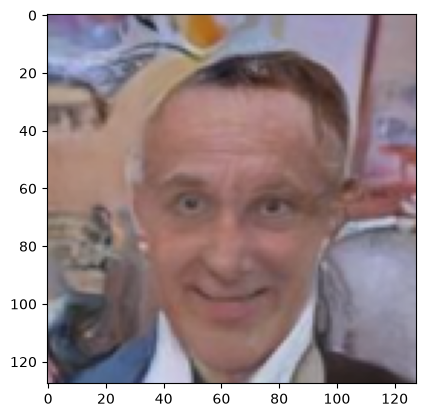

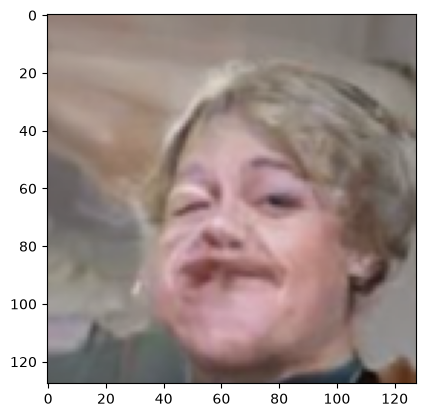

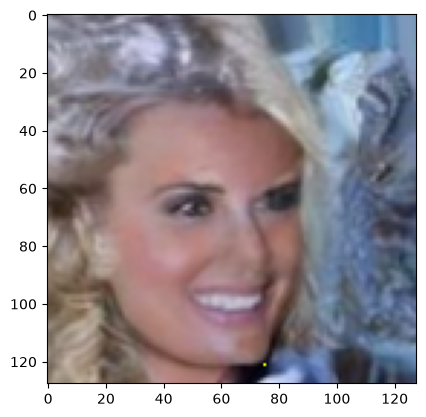

In [13]:
img_count = 10
model.eval()
with torch.no_grad():
    results = model.sample(IMG_SIZE,IMG_SIZE,model.ending_channels,num_images=img_count)

    for i in range(img_count):
        show_tensor_image(results[i].cpu())
        plt.show()
plt.show()
a = model.train()

In [35]:
image[:10].shape

torch.Size([10, 3, 128, 128])

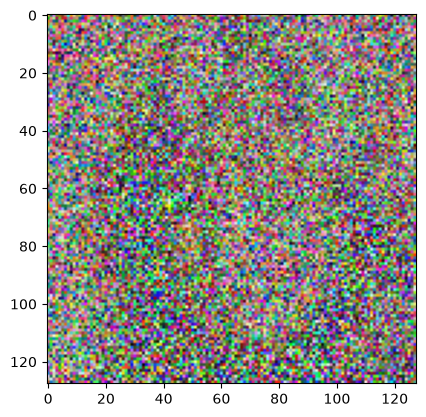

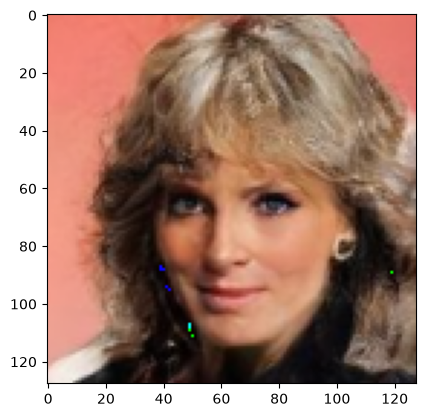

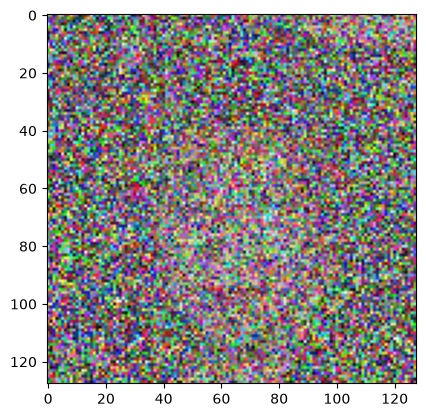

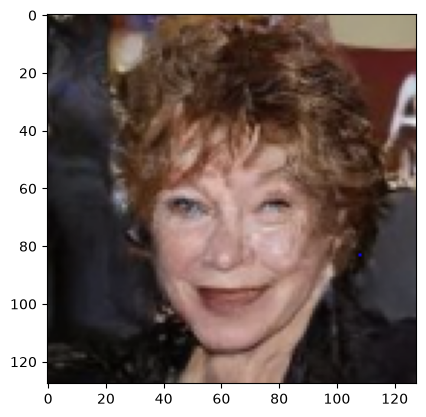

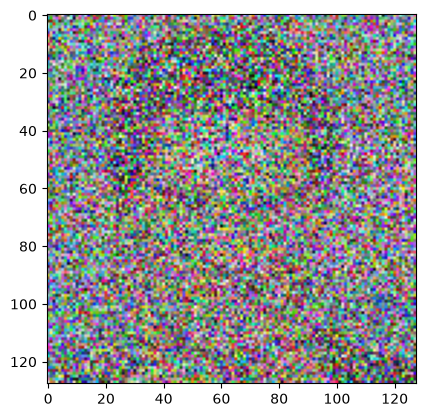

...

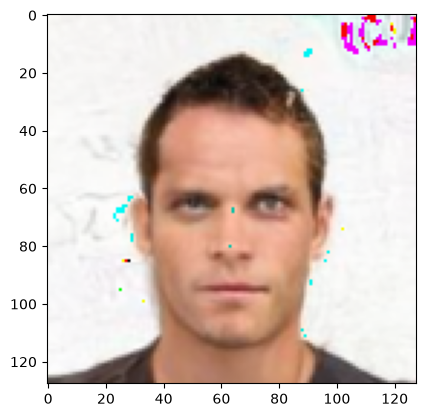

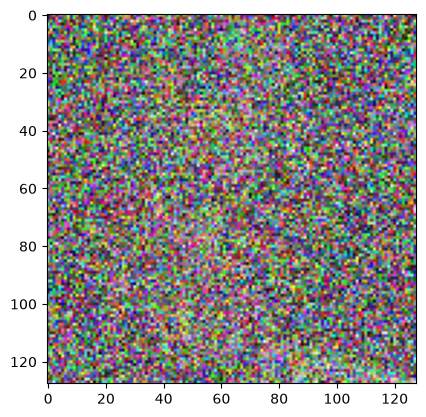

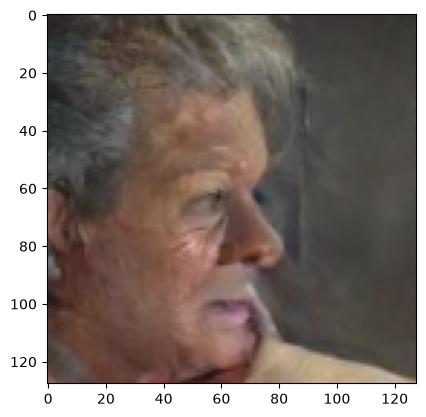

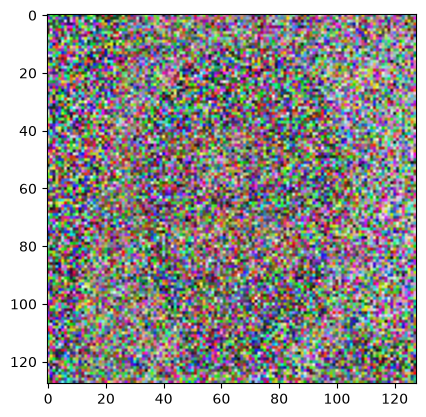

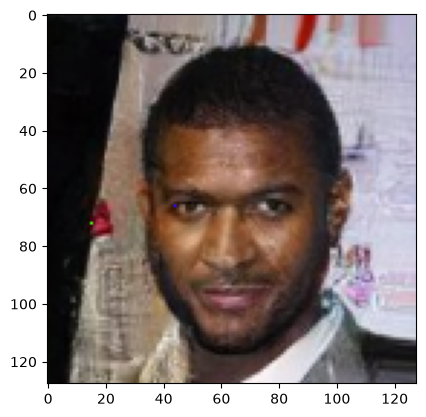

In [14]:
diffuser = ImageDiffuser().to(device)
image = next(iter(dataloader))[0].to(device)
t = torch.ones((image.shape[0],), dtype=torch.long) * 200
noisy_image, noise = diffuser.add_noise(image, t)

img_count = 10
model.eval()
with torch.no_grad():
    results = model.sample_from(noisy_image[:img_count],105)

    for i in range(img_count):
        print("=================================")
        show_tensor_image(noisy_image[i].cpu())
        plt.show()
        show_tensor_image(results[i].cpu())
        plt.show()
plt.show()
a = model.train()